
### BigData Project
# **Russian** language processing via Spark(**NLP**) 🔥

Vadim Alperovich <br>
IAD21

[![Go to colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/VirtualRoyalty/spark-nlp-project/blob/main/bigdata-project.ipynb)


### **Content:**
---

1. Colab-Spark setup
2. Data loading
3. EDA & Preprocessing
4. Pipelines & Experiments

 1. Text preprocessing

 2. Text classification 
    - BoW models + LogReg
    - Transfer Learning (at least an attempt 😀)

 3. Entity Recgnition & Entity Linking 


### **Tech stack:**
 - [pySpark](https://spark.apache.org/docs/latest/api/python/) & 
 [pySpark.ml](https://spark.apache.org/docs/2.3.1/api/python/pyspark.ml.html)
 - [sparkNLP](https://nlp.johnsnowlabs.com/)
 - [pymorphy2](https://pymorphy2.readthedocs.io/en/stable/)
 - [SpaCy](https://spacy.io/)
 - [HuggingFace](https://huggingface.co/) 
 - [Textblob](https://textblob.readthedocs.io/en/dev/)
 

 *...and much more* 🤘

# 0. Connect to GoogleDrive

In [1]:
from google.colab import drive
drive.mount('/content/drive')
PROJECT_FOLDER = '/content/drive/MyDrive/spark-project/'
%ls {PROJECT_FOLDER}

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
bigdata-project.html   cc.ru.64.bin  cointegrated/  Geotrend/
bigdata-project.ipynb  cc.ru.64.vec  data/


In [ ]:
# in case you want to covert this ipython to html
%ls drive/MyDrive/spark-project/
!jupyter nbconvert --to html {PROJECT_FOLDER}/bigdata-project

# 1. Colab-Spark setup

In [1]:
%%time
from IPython.display import clear_output
!wget http://setup.johnsnowlabs.com/colab.sh -O - | bash

# Install Spark NLP Display for visualization
!pip install --ignore-installed spark-nlp-display
clear_output(wait=True)

CPU times: user 1.1 s, sys: 206 ms, total: 1.3 s
Wall time: 1min 21s


In [2]:
%%time
import sparknlp
import pyspark.sql.functions as F
import pyspark.sql.types as T

from pyspark.ml import Pipeline
from pyspark.sql import SparkSession
from sparknlp.annotator import *
from sparknlp.base import *
from sparknlp.pretrained import PretrainedPipeline

spark = sparknlp.start()

CPU times: user 479 ms, sys: 75.5 ms, total: 554 ms
Wall time: 24.6 s


# 2. Data loading

- **Lenta.Ru-News-Dataset:** https://github.com/yutkin/Lenta.Ru-News-Dataset
- **CORUS:** https://github.com/natasha/corus

In [15]:
%%time
# download the Lenta.ru v1.0 russian news dataset
# !wget https://github.com/yutkin/Lenta.Ru-News-Dataset/releases/download/v1.0/lenta-ru-news.csv.gz -P {PROJECT_FOLDER}/data
# download supporting library
!pip install corus
!pip install --ignore-installed  --user numpy
!pip install --ignore-installed  --user  pandas
clear_output(wait=True)

CPU times: user 214 ms, sys: 153 ms, total: 366 ms
Wall time: 22.9 s


In [3]:
import json
import numpy as np
import pandas as pd

import plotly
import plotly.express as px
from IPython.display import HTML
import warnings
warnings.simplefilter('ignore')

In [7]:
# from corus import load_lenta

# path = f'{PROJECT_FOLDER}/data/lenta-ru-news.csv.gz'
# num_of_docs_to_save = 200000
# records = load_lenta(path)


# docs = []
# for i, doc in enumerate(records):
#     if i > num_of_docs_to_save:
#         break
#     docs.append(list(doc))
# df = pd.DataFrame(docs, columns=['URL', 'title', 'text', 'topic', 'tags', 'date'])
# df.to_csv(f'{PROJECT_FOLDER}/data/lenta-ru-news{num_of_docs_to_save}.csv', sep='\t', index=None)

In [4]:
num_of_docs = 200000 # size ~0.5GB
spark_df = spark.read \
      .option("inferSchema","true") \
      .option("header", True) \
      .csv(f'{PROJECT_FOLDER}/data/lenta-ru-news{num_of_docs}.csv', sep='\t')
print(f'Hell yeah, spark_df is {type(spark_df)}!')
print(f'spark_df has {spark_df.count()} rows')
spark_df

Hell yeah, spark_df is <class 'pyspark.sql.dataframe.DataFrame'>!
spark_df has 200001 rows


DataFrame[URL: string, title: string, text: string, topic: string, tags: string, date: string]

In [10]:
spark_df.show(n=10, truncate=30)

+------------------------------+------------------------------+------------------------------+-----------------+---------------+----+
|                           URL|                         title|                          text|            topic|           tags|date|
+------------------------------+------------------------------+------------------------------+-----------------+---------------+----+
|https://lenta.ru/news/2018/...|Названы регионы России с са...|Вице-премьер по социальным ...|           Россия|       Общество|null|
|https://lenta.ru/news/2018/...|Австрия не представила дока...|Австрийские правоохранитель...|            Спорт|    Зимние виды|null|
|https://lenta.ru/news/2018/...|Обнаружено самое счастливое...|Сотрудники социальной сети ...|      Путешествия|            Мир|null|
|https://lenta.ru/news/2018/...|В США раскрыли сумму расход...|С начала расследования росс...|              Мир|       Политика|null|
|https://lenta.ru/news/2018/...|Хакеры рассказали о планах ...

# 3. EDA & Preprocessing

**Empty values filtering**

In [5]:
spark_df = spark_df.filter(F.col('text').isNotNull() & F.col('topic').isNotNull() & F.col('tags').isNotNull())
spark_df = spark_df.filter(F.col('text') != '')
spark_df_len = spark_df.count()
print(f'Count after filtering: {spark_df_len}')

Count after filtering: 187735


**Distributions**

In [13]:
%%time
column = 'topic'
topic_unique = spark_df.select(column).distinct().count()
print(f'*{column}* columns has {topic_unique} unique values', )
topic_stat = spark_df.select(column).groupBy(column).count().orderBy(F.desc('count')).toPandas()
topic_stat

*topic* columns has 21 unique values


,topic,count
0,Россия,30938
1,Мир,29058
2,Спорт,15817
3,Бывший СССР,14649
4,Интернет и СМИ,12561
5,Культура,12504
6,Экономика,12362
7,Наука и техника,11636
8,Силовые структуры,10396
9,Из жизни,8291


**Drop minor categories**

In [6]:
column = 'topic'
lower_bound = 500

topic_grouped = spark_df.groupBy([column]).agg(F.count(column).alias("count"))
topic_relevant = topic_grouped.filter(F.col("count") > lower_bound).drop("count")
spark_df = spark_df.join(topic_relevant, column, "inner")

In [15]:
%%time
column = 'topic'
topic_unique = spark_df.select(column).distinct().count()
print(f'*{column}* columns has {topic_unique} unique values', )
topic_stat = spark_df.select(column).groupBy(column).count().orderBy(F.desc('count')).toPandas()
topic_stat

*topic* columns has 16 unique values
CPU times: user 203 ms, sys: 25.9 ms, total: 229 ms
Wall time: 34.3 s


,topic,count
0,Россия,30938
1,Мир,29058
2,Спорт,15817
3,Бывший СССР,14649
4,Интернет и СМИ,12561
5,Культура,12504
6,Экономика,12362
7,Наука и техника,11636
8,Силовые структуры,10396
9,Из жизни,8291


In [16]:
fig = px.bar(topic_stat, x=column, y='count', 
             width=1000, height=400,  title=f"*{column}* distribution")
HTML(fig.to_html())

In [17]:
column = 'tags'
tags_unique = spark_df.select(column).distinct().count()
print(f'*{column}* columns has {tags_unique} unique values')
tags_stat = spark_df.select(column).groupBy(column).count().orderBy(F.asc('count')).toPandas()
fig = px.bar(tags_stat, x='count', y=column, orientation='h',
             width=600, height=800,  title=f"*{column}* distribution")
HTML(fig.to_html())

*tags* columns has 80 unique values


In [18]:
def get_token_count(text, token_len=False):
    if token_len:
        return len(text.split(' '))
    return len(text)

spark_get_char_count = F.udf(lambda x: get_token_count(x), T.IntegerType())
spark_get_token_count = F.udf(lambda x: get_token_count(x, token_len=True), T.IntegerType())

In [19]:
%%time
# ```text``` stats
spark_df = spark_df.withColumn("char_count", spark_get_char_count(F.col("text")))
spark_df = spark_df.withColumn("token_count", spark_get_token_count(F.col("text")))
# ```title``` stats
spark_df = spark_df.withColumn("char_count_title", spark_get_char_count(F.col("title")))
spark_df = spark_df.withColumn("token_count_title", spark_get_token_count(F.col("title")))

CPU times: user 22.7 ms, sys: 3.79 ms, total: 26.5 ms
Wall time: 149 ms


In [ ]:
# spark_df.show(n=5, truncate=10)

In [21]:
spark_df.select('char_count', 'token_count', 'char_count_title', 'token_count_title').describe().show()

+-------+------------------+------------------+-----------------+------------------+
|summary|        char_count|       token_count| char_count_title| token_count_title|
+-------+------------------+------------------+-----------------+------------------+
|  count|            187277|            187277|           187277|            187277|
|   mean|1317.0585549747166|179.26585752655157|58.43323526113725| 6.778958441239447|
| stddev| 478.4035983395154| 63.92448086975171|12.70694486048103|1.4634671389318274|
|    min|                88|                11|               12|                 1|
|    max|             10224|              1246|               98|                23|
+-------+------------------+------------------+-----------------+------------------+



# 4. Pipelines & Experiments

## 4.1 Text processing pipeline

In [22]:
%%time 

document_assembler = DocumentAssembler() \
    .setInputCol('text') \
    .setOutputCol('document')

tokenizer = Tokenizer() \
    .setInputCols(['document']) \
    .setOutputCol('token')

normalizer = Normalizer() \
      .setInputCols(["token"]) \
      .setLowercase(True) \
      .setOutputCol("normalized_token")

stopwords_cleaner = StopWordsCleaner.pretrained("stopwords_ru", "ru")\
      .setInputCols("normalized_token")\
      .setOutputCol("clean_token")\
      .setCaseSensitive(False)

lemmatizer = LemmatizerModel.pretrained("lemma", "ru") \
        .setInputCols(["clean_token"]) \
        .setOutputCol("lemma")

finisher = Finisher() \
      .setInputCols(["lemma"]) \
      .setOutputCols(["token_features"]) \
      .setOutputAsArray(True) \
      .setCleanAnnotations(False)

preprocessing_pipeline = Pipeline(stages=[
                                  document_assembler, 
                                  tokenizer,
                                  normalizer,
                                  stopwords_cleaner,
                                  lemmatizer,
                                  finisher])

stopwords_ru download started this may take some time.
Approximate size to download 2.9 KB
[OK!]
lemma download started this may take some time.
Approximate size to download 1.3 MB
[OK!]
CPU times: user 179 ms, sys: 13.1 ms, total: 192 ms
Wall time: 17.4 s


In [23]:
%%time
columns = ['text', 'topic', 'tags']
preprocessor_model = preprocessing_pipeline.fit(spark_df[columns])
doc_df = preprocessor_model.transform(spark_df[columns])
print(f'**doc_df type** is {type(doc_df)}')
doc_df.printSchema()

**doc_df type** is <class 'pyspark.sql.dataframe.DataFrame'>
root
 |-- text: string (nullable = true)
 |-- topic: string (nullable = true)
 |-- tags: string (nullable = true)
 |-- document: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |    |-- metadata: map (nullable = true)
 |    |    |    |-- key: string
 |    |    |    |-- value: string (valueContainsNull = true)
 |    |    |-- embeddings: array (nullable = true)
 |    |    |    |-- element: float (containsNull = false)
 |-- token: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |

In [24]:
doc_df[['text', 'token_features']].show(n=10, truncate=50)

+--------------------------------------------------+--------------------------------------------------+
|                                              text|                                    token_features|
+--------------------------------------------------+--------------------------------------------------+
|В 2019 году Госдума рассмотрит законопроект, ра...|[госдума, рассмотреть, законопроект, разрешать,...|
|Ученые Арктического плавучего университета впер...|[ученый, арктического, плавучий, университет, в...|
|Красноярский лицей №6 по аналогии с вымышленным...|[красноярский, лицей, аналогия, вымышленным, хо...|
|В рамках уникального для Мурманской области про...|[рамка, уникальный, мурманской, область, проект...|
|После обрушившихся на Красноярск 30-градусных м...|[обрушиться, красноярск, градусных, мороз, возл...|
|Житель Норильска попытался дойти до дома во вре...|[житель, норильска, пытаться, дойти, дома, силь...|
|"Власти Чукотки проведут испытания новых образц...|[власть, чук

**Exploring words (tokens) fequencies**

In [37]:
%%time
word_counts = doc_df.select('topic', F.explode('token_features').alias('words')) \
  .groupBy('topic', 'words') \
  .agg(F.count(F.col('words')).alias('count')) \
  .filter((F.col('count') > 20) & (F.col('count') < (spark_df_len // (topic_unique * 3))) )

# word_counts.show()

CPU times: user 10.1 ms, sys: 109 µs, total: 10.2 ms
Wall time: 105 ms


In [40]:
%%time
word_counts_df = word_counts.toPandas()
word_counts_df = word_counts_df.sort_values(['count'], ascending=False).set_index('words')
word_counts_df.info()

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 9.3 µs


In [139]:
# print(word_counts_df.topic.unique())
word_counts_df.head()

,topic,count
words,,
сша,Мир,7128
компания,Экономика,6098
сообщать,Мир,5663
россии,Россия,5454
страна,Мир,5273


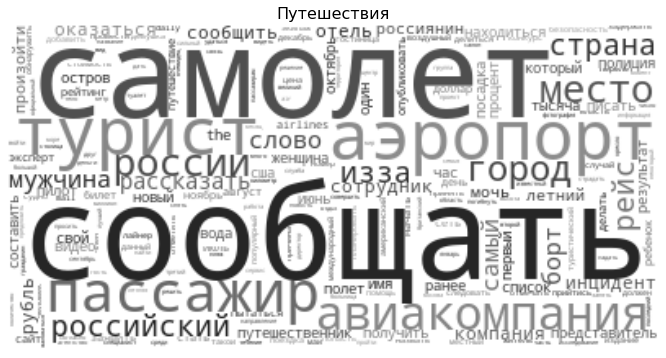

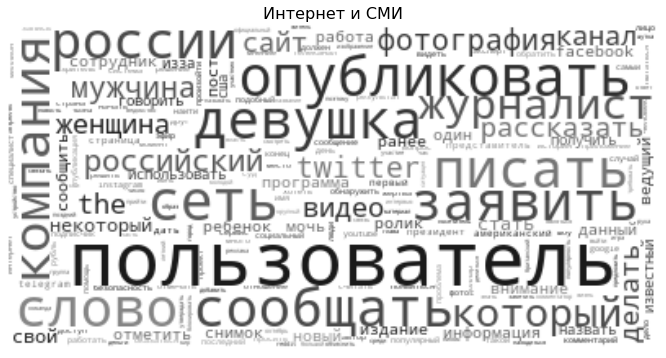

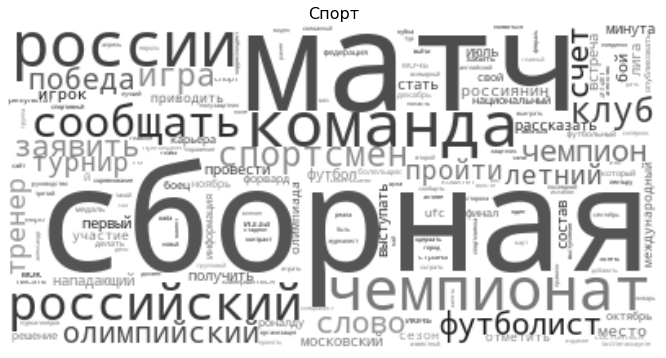

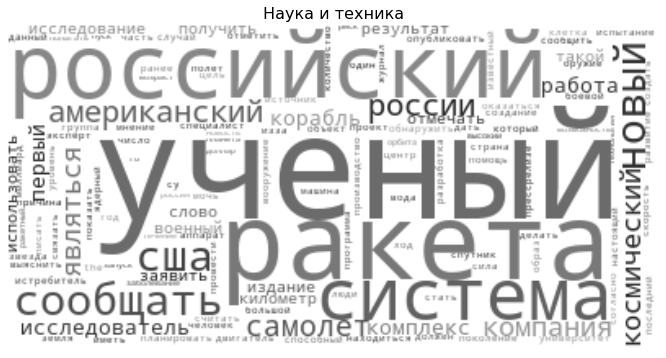

In [138]:
import random
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def grey_color_func(word, font_size, position, orientation, 
                    random_state=None, **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(5, 55)

for topic in ['Путешествия', 'Интернет и СМИ', 'Спорт', 'Наука и техника']:
    tmp = word_counts_df[word_counts_df.topic == topic][['count']]
    wc = WordCloud(background_color="white", max_words=750)
    wc.generate_from_frequencies(dict(*tmp.T.to_dict('records')))
    plt.figure(figsize=(12, 6))
    plt.imshow(wc.recolor(color_func=grey_color_func), interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{topic}', fontsize=16)
    plt.show()

# 4.2 Bag-of-Words + LogReg

In [41]:
from pyspark.ml.feature import CountVectorizer, HashingTF, IDF, OneHotEncoder, StringIndexer, VectorAssembler, SQLTransformer

In [42]:
countVectors = CountVectorizer(inputCol="token_features", outputCol="features", vocabSize=5000, minDF=20)
label_stringIdx = StringIndexer(inputCol="topic", outputCol="label")

counter_pipeline = Pipeline(
    stages=preprocessing_pipeline.getStages()+[countVectors, label_stringIdx])
counter_pipeline.getStages()

[DocumentAssembler_887cd3e4a697,
 Tokenizer_123543294371,
 Normalizer_01604dcabe34,
 STOPWORDS_CLEANER_3187062cd9db,
 LEMMATIZER_59ad4a12c2e7,
 Finisher_403b172d9c06,
 CountVectorizer_6a43289332d4,
 StringIndexer_1347503afae2]

In [43]:
hashingTF = HashingTF(inputCol="token_features", outputCol="tf_features", numFeatures=5000)
idf = IDF(inputCol="tf_features", outputCol="features", minDocFreq=20)
label_stringIdx = StringIndexer(inputCol="topic", outputCol="label")

tfidf_pipeline = Pipeline(
    stages=preprocessing_pipeline.getStages()+[hashingTF, idf, label_stringIdx])
tfidf_pipeline.getStages()

[DocumentAssembler_887cd3e4a697,
 Tokenizer_123543294371,
 Normalizer_01604dcabe34,
 STOPWORDS_CLEANER_3187062cd9db,
 LEMMATIZER_59ad4a12c2e7,
 Finisher_403b172d9c06,
 HashingTF_8d8c2f17f962,
 IDF_26c544f28e1f,
 StringIndexer_273a14684ddf]

In [44]:
%%time
# set seed for reproducibility
(train_df, test_df) = spark_df.select('text', 'topic').randomSplit([0.7, 0.3], seed=100)
print(f'Training Dataset Count: {train_df.count()}')
print(f'Test Dataset Count: {test_df.count()}')

Training Dataset Count: 131239
Test Dataset Count: 56038
CPU times: user 1.19 s, sys: 118 ms, total: 1.31 s
Wall time: 3min 33s


In [45]:
%%time
counter_model = counter_pipeline.fit(train_df[['text', 'topic']])
train_df_counter = counter_model.transform(train_df[['text', 'topic']])
test_df_counter = counter_model.transform(test_df[['text', 'topic']])

CPU times: user 2.77 s, sys: 290 ms, total: 3.07 s
Wall time: 7min 14s


In [46]:
%%time
tfidf_model = tfidf_pipeline.fit(train_df[['text', 'topic']])
train_df_tfidf = tfidf_model.transform(train_df[['text', 'topic']])
test_df_tfidf = tfidf_model.transform(test_df[['text', 'topic']])

CPU times: user 2.81 s, sys: 310 ms, total: 3.12 s
Wall time: 7min 23s


In [149]:
train_df_counter.select('token_features', 'features', 'label', 'topic').show(truncate=50)

+--------------------------------------------------+--------------------------------------------------+-----+-----------------+
|                                    token_features|                                          features|label|            topic|
+--------------------------------------------------+--------------------------------------------------+-----+-----------------+
|[фото, опубликовать, chaifband, лидер, группа, ...|(5000,[1,2,18,30,90,91,97,114,115,130,139,144,1...|  8.0|         Культура|
|[bellator, представить, видеообзор, победа, рос...|(5000,[2,13,25,46,70,134,203,279,312,394,417,46...|  2.0|            Спорт|
|[авиадебошира, подравшегося, бортпроводницей, р...|(5000,[4,18,22,23,34,40,45,47,52,61,81,104,105,...| 12.0|      Путешествия|
|[автор, канал, jerryrigeverything, поиздевался,...|(5000,[1,9,39,53,84,87,105,112,129,149,160,165,...|  5.0|  Наука и техника|
|[актер, никита, джигурда, заявить, собрать, мил...|(5000,[1,4,11,13,14,17,36,39,49,80,88,96,97,105...| 

### LogReg

In [47]:
from pyspark.ml.classification import LogisticRegression

In [48]:
%%time
lr_counter = LogisticRegression(maxIter=10, regParam=0.3, elasticNetParam=0)
lrModel_counter = lr_counter.fit(train_df_counter)
predictions_counter = lrModel_counter.transform(test_df_counter)

CPU times: user 2.5 s, sys: 275 ms, total: 2.78 s
Wall time: 7min 27s


In [49]:
%%time

lr_tfidf = LogisticRegression(maxIter=10, regParam=0.3, elasticNetParam=0)
lrModel_tfidf = lr_tfidf.fit(train_df_tfidf)
predictions_tfidf = lrModel_tfidf.transform(test_df_tfidf)

CPU times: user 2.64 s, sys: 303 ms, total: 2.94 s
Wall time: 7min 50s


In [155]:
predictions_counter.show(10, truncate=5)

+-----+-----+--------+-----+----------------+-----------+-----+--------------+--------+-----+-------------+-----------+----------+
| text|topic|document|token|normalized_token|clean_token|lemma|token_features|features|label|rawPrediction|probability|prediction|
+-----+-----+--------+-----+----------------+-----------+-----+--------------+--------+-----+-------------+-----------+----------+
| А...|На...|   [[...|[[...|           [[...|      [[...|[[...|         [а...|   (5...|  5.0|        [1...|      [0...|       5.0|
| А...|Спорт|   [[...|[[...|           [[...|      [[...|[[...|         [а...|   (5...|  2.0|        [1...|      [0...|       2.0|
| Б...|Спорт|   [[...|[[...|           [[...|      [[...|[[...|         [б...|   (5...|  2.0|        [1...|      [0...|       2.0|
| В...|Из...|   [[...|[[...|           [[...|      [[...|[[...|         [с...|   (5...|  6.0|        [1...|      [0...|       6.0|
| В...|Спорт|   [[...|[[...|           [[...|      [[...|[[...|         [с...|   (5

In [50]:
from sklearn.metrics import confusion_matrix, classification_report, f1_score

In [51]:
label_names = counter_model.stages[-1].labels
len(label_names)

16

In [52]:
%%time
y_true = predictions_counter.select("label")
y_true = y_true.toPandas()

y_pred = predictions_counter.select("prediction")
y_pred = y_pred.toPandas()

lnames = [l  for i, l in enumerate(label_names) if i in y_true.label.unique()]
print(classification_report(y_true.label, y_pred.prediction, target_names=lnames))

                   precision    recall  f1-score   support

           Россия       0.65      0.83      0.73      9240
              Мир       0.77      0.91      0.83      8706
            Спорт       0.94      0.96      0.95      4597
      Бывший СССР       0.86      0.81      0.83      4460
   Интернет и СМИ       0.76      0.70      0.73      3739
         Культура       0.85      0.84      0.85      3740
        Экономика       0.80      0.73      0.76      3710
  Наука и техника       0.89      0.86      0.87      3454
Силовые структуры       0.76      0.66      0.70      3118
         Из жизни       0.76      0.57      0.65      2519
         Ценности       0.95      0.85      0.90      2243
           Бизнес       0.72      0.59      0.65      2067
              Дом       0.88      0.64      0.74      1927
      Путешествия       0.86      0.63      0.73      1922
   69-я параллель       0.89      0.02      0.04       387
             Крым       1.00      0.01      0.03       

In [53]:
%%time
y_true_tfidf = predictions_tfidf.select("label")
y_true_tfidf = y_true_tfidf.toPandas()

y_pred_tfidf = predictions_tfidf.select("prediction")
y_pred_tfidf = y_pred_tfidf.toPandas()

print(classification_report(y_true.label, y_pred_tfidf.prediction, target_names=lnames))

                   precision    recall  f1-score   support

           Россия       0.61      0.83      0.71      9240
              Мир       0.73      0.91      0.81      8706
            Спорт       0.94      0.95      0.94      4597
      Бывший СССР       0.85      0.78      0.82      4460
   Интернет и СМИ       0.74      0.67      0.71      3739
         Культура       0.84      0.81      0.83      3740
        Экономика       0.79      0.72      0.75      3710
  Наука и техника       0.88      0.84      0.86      3454
Силовые структуры       0.76      0.62      0.68      3118
         Из жизни       0.75      0.49      0.60      2519
         Ценности       0.94      0.83      0.88      2243
           Бизнес       0.73      0.55      0.62      2067
              Дом       0.89      0.60      0.71      1927
      Путешествия       0.87      0.57      0.69      1922
   69-я параллель       1.00      0.00      0.01       387
             Крым       1.00      0.00      0.01       

In [60]:
print(classification_report(y_true.label, y_pred.prediction, target_names=lnames, labels=range(0, 11)))

                   precision    recall  f1-score   support

           Россия       0.65      0.83      0.73      9240
              Мир       0.77      0.91      0.83      8706
            Спорт       0.94      0.96      0.95      4597
      Бывший СССР       0.86      0.81      0.83      4460
   Интернет и СМИ       0.76      0.70      0.73      3739
         Культура       0.85      0.84      0.85      3740
        Экономика       0.80      0.73      0.76      3710
  Наука и техника       0.89      0.86      0.87      3454
Силовые структуры       0.76      0.66      0.70      3118
         Из жизни       0.76      0.57      0.65      2519
         Ценности       0.95      0.85      0.90      2243

        micro avg       0.79      0.82      0.80     49526
        macro avg       0.82      0.79      0.80     49526
     weighted avg       0.79      0.82      0.80     49526



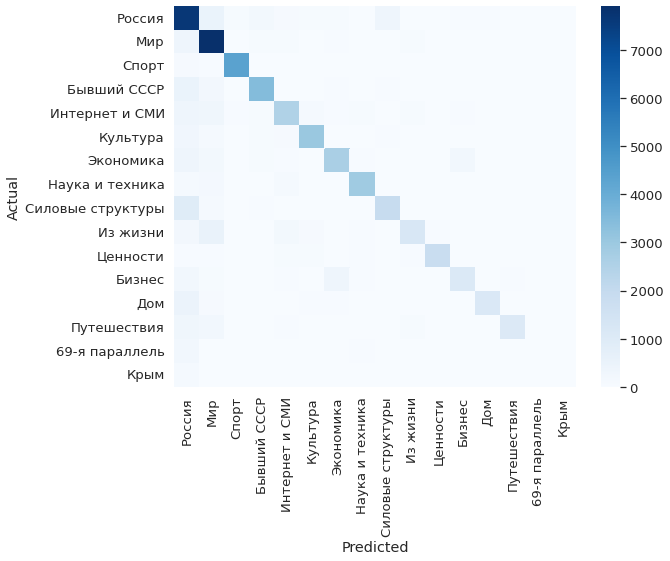

In [76]:
import matplotlib.pyplot as plt
import seaborn as sn
from sklearn.metrics import confusion_matrix


def plot_confmatrix(pred_df=y_pred_tfidf, target='label'):
    ground_true = y_true[target][~y_true[target].isna()]
    predict = pred_df.prediction
    cf = confusion_matrix(ground_true, predict)
    df_cm = pd.DataFrame(cf, columns=lnames, index=lnames)
    df_cm.index.name = "Actual"
    df_cm.columns.name = "Predicted"
    plt.figure(figsize=(9, 7))
    sn.set(font_scale=1.2)  # for label size
    sn.heatmap(df_cm, cmap="Blues", annot_kws={"size": 18})
    pass
plot_confmatrix()

--- ---

## 4.3 Transfer learning 🤗

Let`s try with power of [HuggingFace](https://huggingface.co/) 
-  https://huggingface.co/cointegrated/rubert-tiny

*P.S. this part doesn't work properly*

In [ ]:
!pip install -q transformers==4.6.1

     |████████████████████████████████| 3.3 MB 17.5 MB/s 
     |████████████████████████████████| 895 kB 35.2 MB/s 


In [ ]:
%%time
from transformers import BertTokenizer, TFBertModel, DistilBertTokenizer, TFDistilBertModel

MODEL_NAME = 'cointegrated/rubert-tiny2'

tokenizer = DistilBertTokenizer.from_pretrained(MODEL_NAME).save_pretrained(f'{PROJECT_FOLDER}/{MODEL_NAME}_tokenizer')
model = TFBertModel.from_pretrained(MODEL_NAME, from_pt=True).save_pretrained(f'{PROJECT_FOLDER}/{MODEL_NAME}', saved_model=True)
clear_output(wait=True)

CPU times: user 23.5 s, sys: 3.57 s, total: 27.1 s
Wall time: 1min 12s


In [ ]:
!cp {PROJECT_FOLDER}/{MODEL_NAME}_tokenizer/vocab.txt {PROJECT_FOLDER}/{MODEL_NAME}/saved_model/1/assets

In [ ]:
document_assembler = DocumentAssembler() \
      .setInputCol("text") \
      .setOutputCol("document")
    
tokenizer = Tokenizer() \
      .setInputCols(["document"]) \
      .setOutputCol("token")
    
normalizer = Normalizer() \
      .setInputCols(["token"]) \
      .setOutputCol("normalized")

stopwords_cleaner = StopWordsCleaner()\
      .setInputCols("normalized")\
      .setOutputCol("cleanTokens")\
      .setCaseSensitive(False)

bert_embeddings = BertEmbeddings.loadSavedModel(f'{PROJECT_FOLDER}/{MODEL_NAME}/saved_model/1', spark) \
      .setInputCols(["document",'cleanTokens'])\
      .setOutputCol("bert")\
      .setCaseSensitive(False)\

embeddingsSentence = SentenceEmbeddings() \
      .setInputCols(["document", "bert"]) \
      .setOutputCol("sentence_embeddings") \
      .setPoolingStrategy("AVERAGE")
    
embeddings_finisher = EmbeddingsFinisher() \
      .setInputCols(["sentence_embeddings"]) \
      .setOutputCols(["finished_sentence_embeddings"]) \
      .setOutputAsVector(True)\
      .setCleanAnnotations(False)

label_stringIdx = StringIndexer(inputCol="topic", outputCol="label")


nlp_pipeline_bert = Pipeline(
    stages=[document_assembler, 
            tokenizer,
            normalizer,
            stopwords_cleaner, 
            bert_embeddings,
            embeddingsSentence,
            embeddings_finisher,
            label_stringIdx])

In [ ]:
subdf = spark_df.limit(500)
subdf.count()

500

In [ ]:
subdf.select('text', 'char_count','token_count').show(truncate=100)

In [ ]:
%%time
bert_model = nlp_pipeline_bert.fit(subdf[['text', 'topic']])

CPU times: user 249 ms, sys: 44.6 ms, total: 294 ms
Wall time: 21 s


In [ ]:
%%time
bert_df = bert_model.transform(subdf[['text', 'topic']])

CPU times: user 74 ms, sys: 12 ms, total: 86.1 ms
Wall time: 363 ms


In [ ]:
bert_df.show(truncate=100)

In [ ]:
from pyspark.sql.functions import explode

bert_df = bert_df.withColumn("features", explode(bert_df.finished_sentence_embeddings))

bert_df.select('text','features','label').show()

In [ ]:
%%time
# set seed for reproducibility
train_df, test_df = bert_df.select('features', 'label').randomSplit([0.7, 0.3], seed=100)

In [ ]:
%%time
lr = LogisticRegression(maxIter=10, regParam=0.3, elasticNetParam=0)
lrModel = lr.fit(train_df)

In [ ]:
predictions = lrModel.transform(test_df)

# 5. Entity Recognition & Entity Linking

**NER pipeline** by [SparkNLP](https://nlp.johnsnowlabs.com/2021/03/22/explain_document_sm_ru.html)
- pretained model: [entity_recognizer_md](https://nlp.johnsnowlabs.com/2021/03/22/entity_recognizer_md_ru.html)

In [6]:
from sparknlp.pretrained import PretrainedPipeline

pipeline = PretrainedPipeline('entity_recognizer_md', lang='ru')

entity_recognizer_md download started this may take some time.
Approx size to download 444 MB
[OK!]


In [7]:
%%time
doc_limit = 10000
spark_df = spark_df.withColumn("article_id", F.monotonically_increasing_id())
ner_df = pipeline.transform(spark_df.limit(doc_limit))
ner_df['entities.result', 'entities.metadata'].show(truncate=50)

+--------------------------------------------------+--------------------------------------------------+
|                                            result|                                          metadata|
+--------------------------------------------------+--------------------------------------------------+
|[Татьяна Голикова, России, РИА Новости., Голико...|[[entity -> PER, sentence -> 0, chunk -> 0], [e...|
|[России, Вене, Дмитрий Любинский, ТАСС., «Дейст...|[[entity -> LOC, sentence -> 1, chunk -> 0], [e...|
|[Instagram, Instagram., Instagram, Диснейленд, ...|[[entity -> MISC, sentence -> 0, chunk -> 0], [...|
|[США, Associated Press, Министерства юстиции СШ...|[[entity -> LOC, sentence -> 0, chunk -> 0], [e...|
|[Anonymous, Integrity Initiative., Института го...|[[entity -> MISC, sentence -> 0, chunk -> 0], [...|
|[МП) Лонгин, Вселенского патриарха, Варфоломея....|[[entity -> ORG, sentence -> 0, chunk -> 0], [e...|
|[Российская, Федерального агентства, Александр ...|[[entity -> 

In [9]:
%%time
ner_df = ner_df.withColumn(
    "tmp", 
    F.explode("entities"))\
    .select("article_id", "tmp.*")
    
ner_df.show(truncate=50)

+-----------+-------------+-----+----+-----------------------------------+-------------------------------------------+----------+
| article_id|annotatorType|begin| end|                             result|                                   metadata|embeddings|
+-----------+-------------+-----+----+-----------------------------------+-------------------------------------------+----------+
|42949672960|        chunk|   12|  18|                            Госдума| [entity -> ORG, sentence -> 0, chunk -> 0]|        []|
|42949672960|        chunk|   68|  81|                     Крайнем Севере| [entity -> LOC, sentence -> 0, chunk -> 1]|        []|
|42949672960|        chunk|  182| 185|                               ТАСС| [entity -> ORG, sentence -> 1, chunk -> 2]|        []|
|42949672960|        chunk|  235| 241|                            Госдумы| [entity -> ORG, sentence -> 1, chunk -> 3]|        []|
|42949672960|        chunk|  280| 285|                             Севера| [entity -> LOC,

In [10]:
%%time
ner_df = ner_df.withColumn("entity_type", F.map_values(F.col("metadata"))[0])
ner_df = ner_df.select('article_id', 'result', 'entity_type')
ner_df.select('article_id', 'result', 'entity_type').show(truncate=50)

+-----------+-----------------------------------+-----------+
| article_id|                             result|entity_type|
+-----------+-----------------------------------+-----------+
|42949672960|                            Госдума|        ORG|
|42949672960|                     Крайнем Севере|        LOC|
|42949672960|                               ТАСС|        ORG|
|42949672960|                            Госдумы|        ORG|
|42949672960|                             Севера|        LOC|
|42949672960|                   Дальнего Востока|       MISC|
|42949672960|               Владимира Пушкарева.|        PER|
|42949672960| Ямало-Ненецкого автономного округа|        LOC|
|42949672960|                              Пур».|        LOC|
|42949672960|     Пуровского, Красноселькупского|        LOC|
|42949672960|                                Пур|        LOC|
|42949672960|                     Большой землей|        LOC|
|42949672960|                              ЯНАО,|        LOC|
|4294967

**Saving entities**

[Optimize conversion between PySpark and pandas DataFrames](https://docs.databricks.com/spark/latest/spark-sql/spark-pandas.html)

In [14]:
%%time
# Enable Arrow-based columnar data transfers
# spark.conf.set("spark.sql.execution.arrow.enabled", "true")
# ner_pd_df =  ner_df.select('*').toPandas()
ner_pd_df =  ner_df.toPandas()
ner_pd_df.to_csv(f'{PROJECT_FOLDER}/data/ner__{doc_limit}df.csv', index=None)

CPU times: user 6.88 s, sys: 724 ms, total: 7.6 s
Wall time: 17min 24s


In [24]:
# ner_pd_df = pd.read_csv(f'{PROJECT_FOLDER}/data/ner__{doc_limit}df.csv', index=None)
print(f'{len(ner_pd_df)} entities found!!!')
ner_pd_df.sample(5)

157112 entities found!!!


,article_id,result,entity_type
68070,4381,As,ORG
126815,8156,"ESforce,",MISC
144878,9249,Davidoff,ORG
121560,7829,Нептуна.,LOC
17450,1138,Саар,PER


In [23]:
%%time
ner_stat = ner_pd_df.groupby('entity_type')[['article_id']].count().reset_index()
# ner_stat
fig = px.bar(ner_stat, x='entity_type', y='article_id', 
             width=1000, height=400,  title=f"*entity_type* distribution")
HTML(fig.to_html())

CPU times: user 543 ms, sys: 27 ms, total: 570 ms
Wall time: 761 ms


**Normalize entity names**

In [27]:
# !pip install pymorphy2
import string
import pymorphy2


morph = pymorphy2.MorphAnalyzer()
translate_table = dict((ord(char), '') for char in string.punctuation+"«»")

def normalize(entity_name):
    entity_name = entity_name.translate(translate_table)
    entity_name = entity_name.strip()
    _morpha = morph.parse(entity_name)
    _forms = [form.normal_form for form in _morpha  
                   if 'NOUN' == form.tag.POS]
    if len(_forms) == 0:
        return None
    else:
        entity_name = _forms[0]
    entity_name = entity_name.lower()
    if len(entity_name) > 2:
        return entity_name
    else:
        return None

In [35]:
%%time
ner_pd_df['norm_result'] = ner_pd_df['result'].apply(lambda x: normalize(x))
ner_pd_df[['result', 'norm_result']].sample(5)

CPU times: user 21.4 ms, sys: 3.98 ms, total: 25.3 ms
Wall time: 32.7 ms


,result,norm_result
146956,«Аэрофлот»,аэрофлот
68489,"Сергея Цапка,",сергея цапка
8453,Россию,россия
87166,"Геральта,",геральт
83374,СФО,None


**Count entities occurrences**

In [33]:
print(f'(before normalizing) Unique NER names: {ner_pd_df.result.nunique()}\n')
print(f'(after normalizing) Unique NER names: {ner_pd_df.norm_result.nunique()}\n')

name_to_count = dict(ner_pd_df.norm_result.value_counts())
ner_pd_df['ner_count'] = ner_pd_df.norm_result.apply(lambda x: name_to_count[x] if x else None)
ner_pd_df.norm_result.value_counts().iloc[:30]

(before normalizing) Unique NER names: 63491

(after normalizing) Unique NER names: 33633



россия            5660
сша               2604
украина           2311
москва            2122
лента             1372
тасс               714
китай              657
киев               639
риа новость        624
великобритания     495
крым               469
интерфакс          452
сирия              449
путин              420
владимир путин     402
трамп              399
европа             370
фсб                346
германия           346
кокорин            338
франция            332
турция             329
санктпетербург     314
вашингтон          311
госдума            311
донбасс            288
подмосковье        276
белоруссия         275
дональд трамп      266
кремль             264
Name: norm_result, dtype: int64

In [41]:
ner_pd_df.ner_count.describe()

count    122499.000000
mean        476.451587
std        1272.165377
min           1.000000
25%           2.000000
50%          17.000000
75%         145.000000
max        5660.000000
Name: ner_count, dtype: float64

In [51]:
fig = px.histogram(ner_pd_df, x="ner_count",  
                   width=1000, height=400, title=f"*Entity names occurrences* distribution")
HTML(fig.to_html())

**Drop entities with minor occurances**

In [53]:
for threshold in [0, 1, 2, 3, 4, 5, 10, 20, 50]:
    _tmp = ner_pd_df[ner_pd_df.ner_count > threshold]
    _nunique = _tmp.norm_result.nunique()
    print(f'Only {_nunique:<6} unique names with >{threshold:<2} thresh (occurances {len(_tmp)})')

Only 33633  unique names with >0  thresh (occurances 122499)
Only 10594  unique names with >1  thresh (occurances 99460)
Only 6108   unique names with >2  thresh (occurances 90488)
Only 4198   unique names with >3  thresh (occurances 84758)
Only 3212   unique names with >4  thresh (occurances 80814)
Only 2593   unique names with >5  thresh (occurances 77719)
Only 1321   unique names with >10 thresh (occurances 68286)
Only 669    unique names with >20 thresh (occurances 58846)
Only 252    unique names with >50 thresh (occurances 45761)


In [95]:
threshold = 5
ner_filter_df = ner_pd_df[ner_pd_df.ner_count > threshold]
print(f'Len: {len(ner_filter_df)}')

Len: 77719


**Drop ivalid entity names**

In [96]:
per_to_count = dict(ner_filter_df[ner_filter_df.entity_type == 'PER'].norm_result.value_counts())
loc_to_count = dict(ner_filter_df[ner_filter_df.entity_type == 'LOC'].norm_result.value_counts())
org_to_count = dict(ner_filter_df[ner_filter_df.entity_type == 'ORG'].norm_result.value_counts())
misc_to_count = dict(ner_filter_df[ner_filter_df.entity_type == 'MISC'].norm_result.value_counts())
mapping = {'PER': per_to_count, 'LOC': loc_to_count, 
           'ORG': org_to_count, 'MISC': misc_to_count, }

def get_possible_ent(name):
    max_occ = 0
    pos_ent = None
    for _ent, _count in mapping.items():
        if _count.get(name, -1) > max_occ:
            max_occ = _count[name]
            pos_ent = _ent
    return pos_ent

In [97]:
ner_filter_df['possible_ent'] = ner_filter_df.norm_result.apply(lambda x: get_possible_ent(x))
ner_filter_df = ner_filter_df[ner_filter_df.entity_type == ner_filter_df.possible_ent]
# dont forget to recompute the stats!
name_to_count = dict(ner_filter_df.norm_result.value_counts())
ner_filter_df['ner_count'] = ner_filter_df.norm_result.apply(lambda x: name_to_count[x] if x else None)
print(f'New len: {len(ner_filter_df)}')

New len: 69156


**More WordClouds ☁️!**

*Look at highly accurate NER results...*

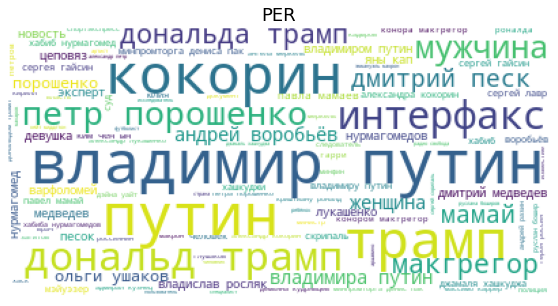

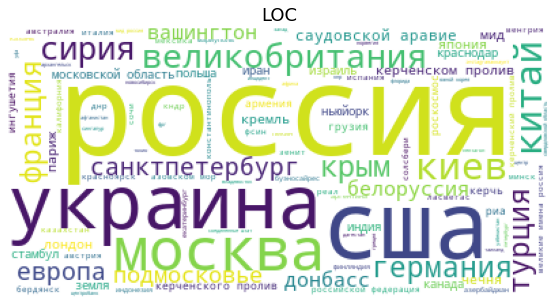

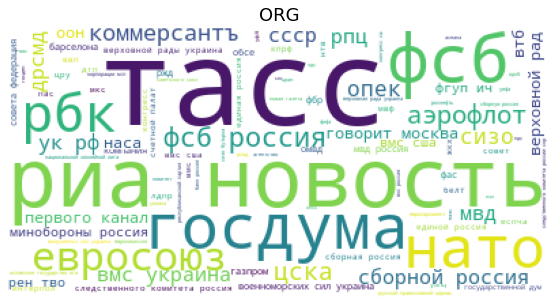

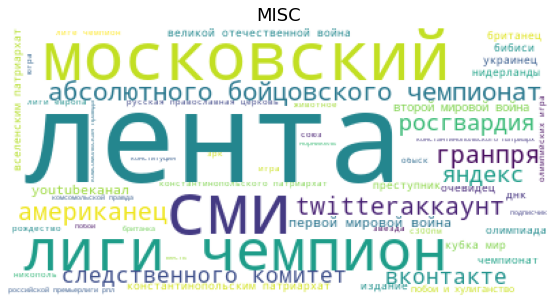

In [98]:
import random
from wordcloud import WordCloud
import matplotlib.pyplot as plt


for ent_type in ner_filter_df.entity_type.unique():
    tmp = ner_filter_df[ner_filter_df.entity_type == ent_type][['norm_result', 'ner_count']]
    tmp = tmp.set_index('norm_result')
    wc = WordCloud(background_color="white", max_words=500)
    wc.generate_from_frequencies(dict(*tmp.T.to_dict('records')))
    plt.figure(figsize=(16, 5))
    plt.imshow(wc)
    plt.axis('off')
    plt.title(f'{ent_type}', fontsize=18)
    plt.show()
    print('\n\n')

### Entity Linking for **Russian** ⚡
 -  an attempt via [DeepPavlov](http://docs.deeppavlov.ai/en/master/features/models/entity_linking.html)
 - brute-force way with [SpaCy](https://spacy.io/) and russian translit/translation 🤡
 - [spaCy-entity-linker](https://github.com/egerber/spaCy-entity-linker)

In [175]:
persons_df = ner_filter_df[ner_filter_df.entity_type == 'PER']
persons_df = persons_df[persons_df.norm_result.apply(lambda x: per_to_count[x] > 100)]
persons_df = persons_df.sort_values(['ner_count'], ascending=False)
print(f'Unique PER names: {persons_df.norm_result.nunique()} len({len(persons_df)})\n')
persons_df.norm_result.value_counts().iloc[:15]

Unique PER names: 24 len(4520)



владимир путин     402
путин              359
кокорин            323
трамп              314
дональд трамп      266
интерфакс          260
петр порошенко     212
мужчина            189
дональда трамп     179
макгрегор          178
мамай              174
дмитрий песк       174
владимира путин    147
женщина            142
андрей воробьёв    140
Name: norm_result, dtype: int64

In [106]:
%%time
!pip install transliterate
!pip install textblob
!pip install spacy-entity-linker
!python -m spacy download  en_core_web_md
!python -m spacy_entity_linker "download_knowledge_base"
clear_output(wait=True)

CPU times: user 43.2 ms, sys: 22.4 ms, total: 65.6 ms
Wall time: 4.07 s


### Try to find real entity by entity names 🤔

In [223]:
per_ent = persons_df['norm_result'].sample().values[0]
per_ent

'владимиром путин'

In [ ]:
import spacy  # version 3.0.6

nlp = spacy.load("en_core_web_md")
nlp.add_pipe("entityLinker", last=True)

In [233]:
from transliterate import translit
from textblob import TextBlob 
url = "http://translate.google.com/translate_a/t?client=te&format=html&dt=bd&dt=ex&dt=ld&dt=md&dt=qca&dt=rw&dt=rm&dt=ss&dt=t&dt=at&ie=UTF-8&oe=UTF-8&otf=2&ssel=0&tsel=0&kc=1"



def get_linked(ent, translate=False, upper=False):
    if upper:
        ent = ent.upper()
    else:
        ent = ent.title()
    if translate:
        blob = TextBlob(ent)
        blob.translator.url = url
        tras_ent = str(blob.translate())
    else:
        tras_ent = translit(ent.title(), "ru", reversed=True)
    print(f'\n\nRequest: **{ent}**  ({tras_ent})\n')
    doc = nlp(tras_ent)
    all_linked_entities = doc._.linkedEntities
    for sent in doc.sents:
        # sent._.linkedEntities.print_super_entities()
        sent._.linkedEntities.pretty_print()
    return

In [224]:
get_linked(per_ent)



Request: **Владимиром Путин**  (Vladimirom Putin)

human (1) : Vladimir Putin
<EntityElement: https://www.wikidata.org/wiki/Q7747 Vladimir Putin            2nd and 4th President of Russia                   >


In [225]:
per_ents = set(persons_df['norm_result'].sample(10).values)
for per_ent in per_ents:
    get_linked(per_ent, translate=True)



Request: **Дональда Трамп**  (Donald Trump)

human (1) : Donald Trump
billionaire (1) : Donald Trump
<EntityElement: https://www.wikidata.org/wiki/Q22686 Donald Trump              45th and current president of the United States   >


Request: **Кокорин**  (Kokorin)



Request: **Интерфакс**  (Interfax)

business (1) : Interfax
enterprise (1) : Interfax
<EntityElement: https://www.wikidata.org/wiki/Q379271 Interfax                                                                    >


Request: **Макгрегор**  (McGregor)

city of the United States (1) : McGregor
<EntityElement: https://www.wikidata.org/wiki/Q969257 McGregor                  city in Texas                                     >


Request: **Трамп**  (Trump)

human (1) : Donald Trump
billionaire (1) : Donald Trump
<EntityElement: https://www.wikidata.org/wiki/Q22686 Donald Trump              45th and current president of the United States   >


Request: **Владимир Путин**  (Vladimir Putin)

human (1) : Vladimir Putin
<Entit

In [226]:
loc_df = ner_filter_df[ner_filter_df.entity_type == 'LOC']
loc_df = loc_df[loc_df.norm_result.apply(lambda x: loc_to_count[x] > 50)]
loc_df = loc_df.sort_values(['ner_count'], ascending=False)
print(f'Unique LOC names: {loc_df.norm_result.nunique()} len({len(loc_df)})\n')
loc_df.norm_result.value_counts().iloc[:10]

Unique LOC names: 106 len(26193)



россия            5423
сша               2591
украина           2261
москва            2112
киев               624
китай              620
великобритания     493
сирия              441
крым               374
германия           327
Name: norm_result, dtype: int64

In [228]:
loc_ents = set(loc_df['norm_result'].sample(20).values)
for ent in loc_ents:
    get_linked(ent, translate=True)



Request: **Украина**  (Ukraine)

sovereign state (1) : Ukraine
<EntityElement: https://www.wikidata.org/wiki/Q212 Ukraine                   sovereign state in Eastern Europe                 >


Request: **Москва**  (Moscow)

capital (1) : Moscow
megacity (1) : Moscow
federal city of Russia (1) : Moscow
big city (1) : Moscow
capital of Russia (1) : Moscow
city/town (1) : Moscow
largest city (1) : Moscow
<EntityElement: https://www.wikidata.org/wiki/Q649 Moscow                    capital city and the largest city of Russia; separate federal subject of Russia>


Request: **Керченский Пролив**  (Kerch Strait)

strait (1) : Strait of Kerch
<EntityElement: https://www.wikidata.org/wiki/Q187890 Strait of Kerch           strait                                            >


Request: **Европа**  (Europe)

political territorial entity (1) : European Union
supranational union (1) : European Union
economic union (1) : European Union
regional organization (1) : European Union
political organisati

In [234]:
org_df = ner_filter_df[ner_filter_df.entity_type == 'ORG']
org_df = org_df[org_df.norm_result.apply(lambda x: org_to_count[x] > 25)]
org_df = org_df.sort_values(['ner_count'], ascending=False)
print(f'Unique ORG names: {org_df.norm_result.nunique()} len({len(org_df)})\n')
org_df.norm_result.value_counts().iloc[:10]

Unique ORG names: 65 len(5627)



тасс           673
риа новость    487
фсб            324
госдума        273
нато           237
рбк            189
евросоюз       175
фсб россия     150
аэрофлот       141
цска           125
Name: norm_result, dtype: int64

In [236]:
org_ents = set(org_df['norm_result'].sample(10).values)
for ent in org_ents:
    get_linked(ent.upper(), translate=True, upper=True)



Request: **РПЦ**  (RPC)

<EntityElement: https://www.wikidata.org/wiki/Q62270 remote procedure call     software mechanism allowing a procedure to execute in another address space, coded as if it were a n>


Request: **СИЗО**  (SIZO)



Request: **ТАСС**  (TASS)

<EntityElement: https://www.wikidata.org/wiki/Q223799 TASS                      Russian state-owned news agency                   >


Request: **НАТО**  (NATO)

<EntityElement: https://www.wikidata.org/wiki/Q7184 NATO                      intergovernmental military alliance of Western states>


Request: **КОММЕРСАНТЪ**  (KOMMERSANT)

<EntityElement: https://www.wikidata.org/wiki/Q1780189 Kommersant                                                                  >


Request: **СБОРНОЙ РОССИЯ**  (TEAM RUSSIA)

<EntityElement: https://www.wikidata.org/wiki/Q7691578 Team Russia                                                                 >


Request: **ВЕРХОВНОЙ РАД**  (VERKHOVNY RAD)

<EntityElement: https://www.wikidata.or

---